# FP_Group_25_CaDoD: **Phase 1** - Cats vs Dogs Detector (CaDoD)

In [ ]:
# Loading all necessary Python libraries
# This notebook was tested in Google Colab with our team Google Drive.
# If run on a local Jupyter, some libraries might need to be installed and Google Sheet&Drive permissions added.

import pandas as pd
import numpy as np
import datetime as dt
from tqdm.notebook import tqdm
import os
import glob
from collections import Counter

import matplotlib
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import seaborn as sns
from PIL import Image
from IPython.display import display, HTML

from google.colab import auth
from google.auth import default
from google.colab import drive
import gspread

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
'''
Authenticating against Google Sheets from the current Colab session
Google Snippets Colab Notebook:
https://colab.research.google.com/notebooks/snippets/sheets.ipynb
'''
auth.authenticate_user()
creds, _ = default()
gc = gspread.authorize(creds)


'''
Mounting Google Drive to the current Colab session
How to Connect Google Colab with Google Drive:
https://www.marktechpost.com/2019/06/07/how-to-connect-google-colab-with-google-drive/
'''
drive.mount('/content/drive')

Mounted at /content/drive


# 1.1 Team Summary

Courtney Payton, Kelly Craig, Martin Breth, Vicente De Leon

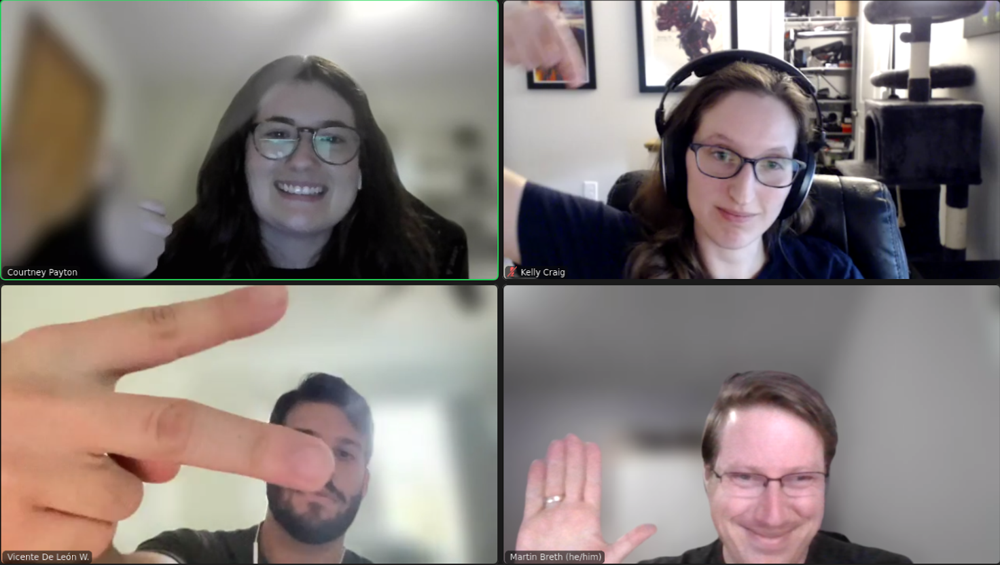


##1.1.1 Team Meeting Schedule

We are planning on meeting about 3 times per week. Due to our different schedules, we are not set on any specific days but we always pick the next meeting date&time based on how many tasks need to be reviewed and our availability.

Data below is based on [TeamTable](https://docs.google.com/spreadsheets/d/11MHZQm2NzXI2MFUvdr0GnMdnetwnpjp1DTNDPRtsnTo/edit?usp=sharing) Google Sheet.

Our meetings so far:

In [ ]:
'''
Loading content from a Google Sheets file and printing out the output
Google Snippets Colab Notebook:
https://colab.research.google.com/notebooks/snippets/sheets.ipynb
'''

# sheet 1 -> Leaders
# sheet 2 -> Meeting_Schedule
# sheet 3 -> Gantt_Chart
worksheet = gc.open('TeamTable').worksheet('Meeting_Schedule')   # Load only the "Meeting_Schedule" sheet from the TeamTable file

rows = worksheet.get_all_values()       # Get the list of all rows from a specific sheet

pd.set_option('display.max_colwidth', 0)
meetings = pd.DataFrame.from_records(rows[1:], columns=[rows[0]])    # Create a Pandas dataframe based on all the rows

meetings

,DATE,TIME,TOPICS
0,2023/03/22,4:00 PM,"Introductions, logistics 1, project preferences, etc."
1,2023/03/26,6:00 PM,"Picking the type of project, logistics 2, submitting Phase 0, starting Phase 1, etc."
2,2023/03/29,4:30 PM,"Updates, organizing tasks, sharing resources, etc."
3,2023/03/31,9:00 PM,"Updates, reviewing&helping with current tasks"
4,2023/04/02,10:00 AM,"Updates, wrapping up current tasks"
5,2023/04/03,8:00 PM,"Updates, finalizing Phase 1"
6,2023/04/04,6:00 PM,Submitting Phase 1


##1.1.2 Phase Leader Plan

We have decided Phase leader will be responsible for these tasks (either doing them or delegating them):

*   Scheduling Zoom meetings
*   Reminding us about meetings (Discord or Canvas notifications)
*   Running meetings
*   Ensuring we finish all critical tasks
*   Adds and updates tasks
*   Submits the Phase assignment(s)
*   Creates and submits phase presentation

Data below is based on [TeamTable](https://docs.google.com/spreadsheets/d/11MHZQm2NzXI2MFUvdr0GnMdnetwnpjp1DTNDPRtsnTo/edit?usp=sharing) Google Sheet.

In [ ]:
'''
Loading content from a Google Sheets file and printing out the output
Google Snippets Colab Notebook:
https://colab.research.google.com/notebooks/snippets/sheets.ipynb
'''

# sheet 1 -> Leaders
# sheet 2 -> Meeting_Schedule
# sheet 3 -> Gantt_Chart
worksheet = gc.open('TeamTable').worksheet('Leaders')     # Load only the "Leaders" sheet from the TeamTable file

rows = worksheet.get_all_values()       # Get the list of all rows from a specific sheet

pd.set_option('display.max_colwidth', 0)
team = pd.DataFrame.from_records(rows[1:], columns=[rows[0]])         # Create a Pandas dataframe based on all the rows

team

,LEADER,PHASE
0,Vicente De Leon,1
1,Kelly Craig,2
2,Courtney Payton,3
3,Martin Berth,4


##1.1.3 Credit/Goals

Legend:

*   Phase - Identifies which phase the task is primarily for
*   Task - Short task identifier
*   End Date - This is the Due Date for a particular task
*   Assignee - Person or persons responsible for completing or delegating particular task
*   Credit - Person or persons who were involved in a particular task
*   Description - Long task description

Data below is based on [TeamTable](https://docs.google.com/spreadsheets/d/11MHZQm2NzXI2MFUvdr0GnMdnetwnpjp1DTNDPRtsnTo/edit?usp=sharing) Google Sheet.

In [ ]:
'''
Loading content from a Google Sheets file
Google Snippets Colab Notebook:
https://colab.research.google.com/notebooks/snippets/sheets.ipynb
'''

# sheet 1 -> Leaders
# sheet 2 -> Meeting_Schedule
# sheet 3 -> Gantt_Chart
worksheet = gc.open('TeamTable').worksheet('Gantt_Chart')     # Load only the "Gantt_Chart" sheet from the TeamTable file

rows = worksheet.get_all_values()       # Get the list of all rows from a specific sheet
pd.set_option('display.max_colwidth', 0)
pd.set_option('display.max_rows', 500)

goals = pd.DataFrame.from_records(rows[6:], columns=[rows[5]])         # Create a Pandas dataframe based on all the rows

goals = goals[['PHASE', 'TASK', 'ASSIGNEE', 'CREDIT', 'DESCRIPTION']]   # Select only relevant columns
goals.columns = ['PHASE', 'TASK', 'ASSIGNEE', 'CREDIT', 'DESCRIPTION']   # Correct the columns

# Ignore columns with "Phase n" and hide Panda's index column
display(goals.loc[~goals['TASK'].isin(['Phase 0', 'Phase 1', 'Phase 2' ,'Phase 3', 'Phase 4'])].style.hide(axis="index"))

PHASE,TASK,ASSIGNEE,CREDIT,DESCRIPTION
,,,,
0,Team logistics,Vicente,"Courtney, Kelly, Martin, Vicente","We will decide on the team logistics and create them (creating a zoom room for meetings, creating Discord server for communication, creating a shared Google Drive location, selecting leaders for each week, etc.). We will individually research which project type we prefer to work on. Finally we will decide on the type of project."
0,Submitting Phase 0,Martin,"Courtney, Kelly, Martin, Vicente",We will meet and Martin will submit the Phase 0 assignment while sharing his screen.
0,Google Colab testing,Vicente,"Martin, Vicente",We will test how to use Google Colab. We will test sharing data between an instance of Google Colab notebook and shared Google Drive directory. We will research paid versions of Google Colab which include GPU for future project phases.
1,Research importing tables into Colab,Vicente,Vicente,"We will research and test inserting data for Leaders, Credit, and Goals as tables into a testing Google Colab notebook for proposal for Phase 1."
1,Test running notebooks on our systems,Martin,"Courtney, Kelly, Martin, Vicente","Since training models in paid Colab can become expensive with time, we will ensure we all can run our code both in Google Colab and locally on our workstations (this will be especially interesting with 3 different OS types and x64 and Apple M CPUs) . We will verify if the provided Docker container is suitable for running CPU/GPU intensive notebooks or if we will need to use Jupyter notebooks directly on our workstations."
1,Create goals in Google Sheets,Martin,Martin,"We will finish scoping goals in Google Doc and will move them into Google Sheets file. We will ensure they are presentable for Leaders, Credit, and Goal sections in the proposal for Phase 1."
1,Provide a baseline coding notebook (local and Colab),Courtney,Courtney,We will have a starting code for testing both local Jupyter notebook and Google Colab.
1,Baseline classification pipeline (SKLearn),Vicente,"Vicente, Courtney",We will research a baseline classification pipeline in SKLearn. We will also describe it for the proposal in Phase 1.
1,Baseline regression pipeline (SKLearn),Martin,Martin,We will research a baseline regression pipeline in SKLearn. We will also describe it for the proposal in Phase 1.


##1.1.4 Gantt Chart

This chart represents our currently planed schedule which is based on our current best estimates and likely will change.

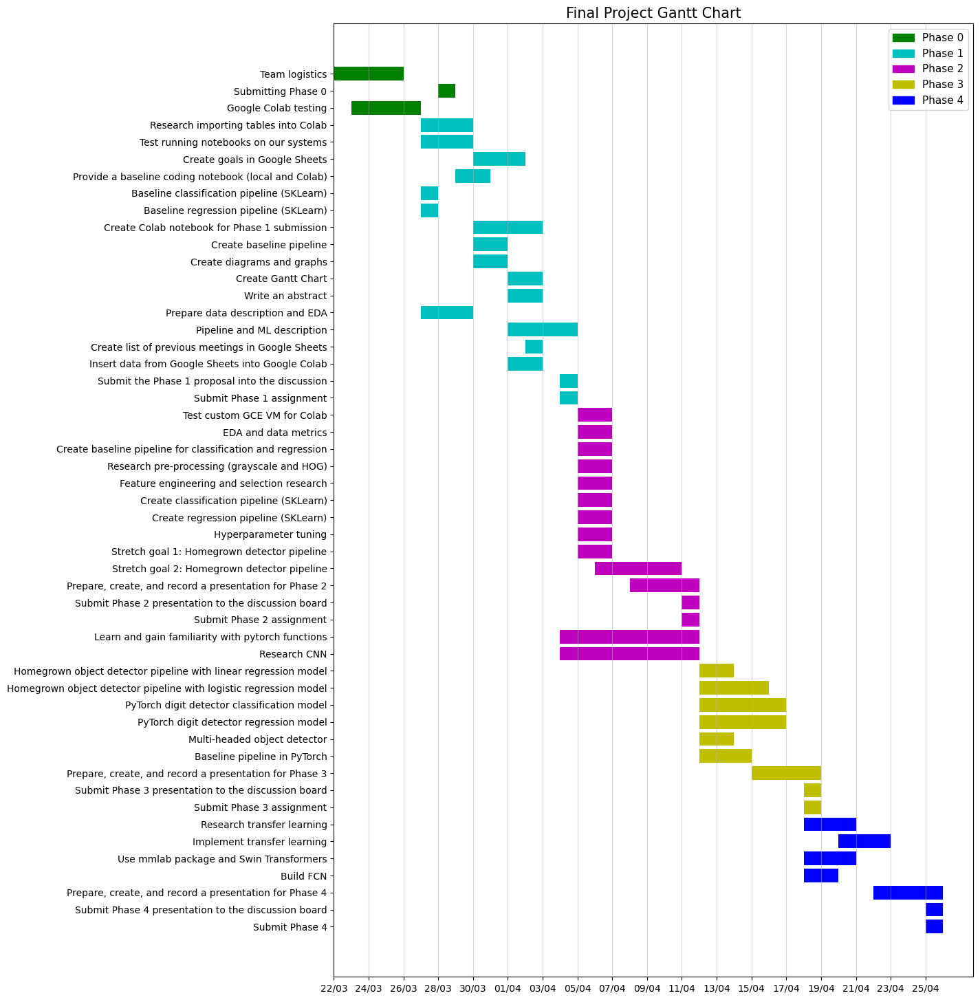

In [ ]:
# Code to create dataframe for Gantt Chart table
'''
How to get a Gantt plot using matplotlib?:
https://www.tutorialspoint.com/how-to-get-a-gantt-plot-using-matplotlib
'''

gc = gspread.authorize(creds)
worksheet = gc.open('TeamTable').worksheet('Gantt_Chart')   # Load only the "Gantt_Chart" sheet from the file
rows = worksheet.get_all_values() # get_all_values gives a list of rows

pd.set_option('display.max_colwidth', 0)
# Create dataframe
gantt = pd.DataFrame.from_records(rows[7:], columns=[rows[5]])
# Keep first 3 columns
gantt = gantt.iloc[:, 1:4]
# Give column names
gantt.columns = ['TASK','START DATE','END DATE']
# Drop Phase rows
index_num = gantt[(gantt['TASK'] == 'Phase 0')|(gantt['TASK'] == 'Phase 1')|(gantt['TASK'] == 'Phase 2')|(gantt['TASK'] == 'Phase 3')|(gantt['TASK'] == 'Phase 4')].index
gantt = gantt.drop(index_num)
# gantt

# Create a gantt chart

# convert to datetime
gantt['START DATE']= pd.to_datetime(gantt['START DATE'])
gantt['END DATE']= pd.to_datetime(gantt['END DATE'])

# Create new columns
gantt['days_to_start'] = (gantt['START DATE'] - gantt['START DATE'].min()).dt.days
gantt['days_to_end'] = (gantt['END DATE'] - gantt['START DATE'].min()).dt.days
gantt['task_duration'] = gantt['days_to_end'] - gantt['days_to_start'] + 1  # to include also the end date
gantt['Phase'] = ['Phase 0'] * 3 + ['Phase 1'] * 17 + ['Phase 2'] * 15 + ['Phase 3'] * 9 + ['Phase 4'] * 7

# Create Gantt Chart
team_colors = {'Phase 0': 'g', 'Phase 1': 'c', 'Phase 2': 'm', 'Phase 3': 'y', 'Phase 4': 'b'} # dictionary with the team names as its keys and base matplotlib colors as its values
fig, ax = plt.subplots()
fig.set_size_inches(12, 18)

for index, row in gantt.iterrows():
  plt.barh(y=row['TASK'], width=row['task_duration'], left=row['days_to_start'], color=team_colors[row['Phase']])

plt.title('Final Project Gantt Chart', fontsize=15)
plt.gca().invert_yaxis()
xticks = np.arange(0, gantt['days_to_end'].max()+2, 2) 
xticklabels = pd.date_range(start=gantt['START DATE'].min(), end=gantt['END DATE'].max()).strftime("%d/%m")

# ticks
ax.set_xticks(xticks)

ax.set_xticklabels(xticklabels[::2])
# axis
ax.xaxis.grid(True, alpha=0.5) 
# Adding a legend
patches = []
for team in team_colors:
    patches.append(matplotlib.patches.Patch(color=team_colors[team]))
ax.legend(handles=patches, labels=team_colors.keys(), fontsize=11) 
plt.show()

#1.2 Project Abstract

The goal of this project is to create optimal cat and dog image detection machine learning models. Two datasets will be utilized for this project: 12,966 cat and dog images and data containing image bounding box information. We will perform exploratory data analysis and create baseline SKLearn pipelines using classification models to predict cat or dog labels and regression models to predict the image bounding box. Initially, we will create logistic regression and linear regression models that will be optimized using stochastic gradient descent and an adaptive learning rate. We will improve model performance by building pipelines with hyperparameter tuning and feature engineering including image cropping and greyscale. A homegrown linear regression model will be developed using the MSE loss function with the four target values of the image bounding box. In addition, we will create a model capable of predicting class and bounding box coordinates simultaneously. To achieve this, we will create a homegrown logistic regression model using the cross entropy and mean squared error loss functions. We will implement transfer learning for cat or dog object detection using EfficientDet and SWIN. Finally, we will build a fully convolutional neural network for a single object classifier and detector.

#1.3 Data Description

The data set for this project contains 12,966 RGB images of cats and dogs with various shapes and aspect ratios. In addition, data containing image bounding box coordinates of the object are stored in a .csv file. There are 6,855 data points classified as dogs and 6,111 as cats.
The image bounding box file contains the following information:

* ImageID - the image ID	
* Source - 	How the bounding box was created. 
    * xclick - manually drawn boxes
    * activemil - enhanced method and human verified. 
* LabelName	- object class ID
* Confidence - dummy value of 1	
* XMin, XMax, YMin, YMax - coordinates of the box, in normalized image coordinates. XMin is in [0,1], where 0 is the leftmost pixel, and 1 is the rightmost pixel in the image. Y coordinates go from the top pixel (0) to the bottom pixel (1).
* IsOccluded - 1 if the object is occluded by another object in the image. 
* IsTruncated - 1 if the object is trunacated in the image. 	
* IsDepiction - 1 if the object is not a real physical instance. 
* IsInside - 1 if the picture taken from the inside of a object 
* XClick1X, XClick2X, XClick3X, XClick4X, XClick1Y, XClick2Y, XClick3Y, XClick4Y - normalized image coordinates of the four extreme points of the object that produced the box. 

# 1.4 Exploratory data analysis (EDA)

In [ ]:
# Loading Variables
# These 2 lines below can be changed based on what you want to run:
dataset = 'cadod.csv'                             # cadod.csv  or cadod_experimental.csv
gdrive_directory = 'MLProject'           # This is your personal GDrive directly. For example in Vicente's case: MLProject
                                 
################################
# You do not need to edit these variables
colab_path = '/content/drive/MyDrive/' + gdrive_directory + '/aml'
images_path = colab_path + '/images'
# images_resized_path = images_path + '/resized'

In [ ]:
df = pd.read_csv(colab_path + '/' + dataset)

In [ ]:
# Image Bounding Box File

In [ ]:
# View the head of the bounding box file. 
df.head()

,ImageID,Source,LabelName,Confidence,XMin,XMax,YMin,YMax,IsOccluded,IsTruncated,...,IsDepiction,IsInside,XClick1X,XClick2X,XClick3X,XClick4X,XClick1Y,XClick2Y,XClick3Y,XClick4Y
0,0000b9fcba019d36,xclick,/m/0bt9lr,1,0.165000,0.903750,0.268333,0.998333,1,1,...,0,0,0.636250,0.903750,0.748750,0.165000,0.268333,0.506667,0.998333,0.661667
1,0000cb13febe0138,xclick,/m/0bt9lr,1,0.000000,0.651875,0.000000,0.999062,1,1,...,0,0,0.312500,0.000000,0.317500,0.651875,0.000000,0.410882,0.999062,0.999062
2,0005a9520eb22c19,xclick,/m/0bt9lr,1,0.094167,0.611667,0.055626,0.998736,1,1,...,0,0,0.487500,0.611667,0.243333,0.094167,0.055626,0.226296,0.998736,0.305942
3,0006303f02219b07,xclick,/m/0bt9lr,1,0.000000,0.999219,0.000000,0.998824,1,1,...,0,0,0.508594,0.999219,0.000000,0.478906,0.000000,0.375294,0.720000,0.998824
4,00064d23bf997652,xclick,/m/0bt9lr,1,0.240938,0.906183,0.000000,0.694286,0,0,...,0,0,0.678038,0.906183,0.240938,0.522388,0.000000,0.370000,0.424286,0.694286


In [ ]:
# Print a concise summary of the bounding box file. 
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12966 entries, 0 to 12965
Data columns (total 21 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   ImageID      12966 non-null  object 
 1   Source       12966 non-null  object 
 2   LabelName    12966 non-null  object 
 3   Confidence   12966 non-null  int64  
 4   XMin         12966 non-null  float64
 5   XMax         12966 non-null  float64
 6   YMin         12966 non-null  float64
 7   YMax         12966 non-null  float64
 8   IsOccluded   12966 non-null  int64  
 9   IsTruncated  12966 non-null  int64  
 10  IsGroupOf    12966 non-null  int64  
 11  IsDepiction  12966 non-null  int64  
 12  IsInside     12966 non-null  int64  
 13  XClick1X     12966 non-null  float64
 14  XClick2X     12966 non-null  float64
 15  XClick3X     12966 non-null  float64
 16  XClick4X     12966 non-null  float64
 17  XClick1Y     12966 non-null  float64
 18  XClick2Y     12966 non-null  float64
 19  XCli

In [ ]:
# Descriptive statistics
df.describe()

,Confidence,XMin,XMax,YMin,YMax,IsOccluded,IsTruncated,IsGroupOf,IsDepiction,IsInside,XClick1X,XClick2X,XClick3X,XClick4X,XClick1Y,XClick2Y,XClick3Y,XClick4Y
count,12966.0,12966.000000,12966.000000,12966.000000,12966.000000,12966.000000,12966.000000,12966.000000,12966.000000,12966.000000,12966.000000,12966.000000,12966.000000,12966.000000,12966.000000,12966.000000,12966.000000,12966.000000
mean,1.0,0.099437,0.901750,0.088877,0.945022,0.464754,0.738470,0.013651,0.045427,0.001157,0.390356,0.424582,0.494143,0.506689,0.275434,0.447448,0.641749,0.582910
std,0.0,0.113023,0.111468,0.097345,0.081500,0.499239,0.440011,0.118019,0.209354,0.040229,0.358313,0.441751,0.405033,0.462281,0.415511,0.401580,0.448054,0.403454
min,1.0,0.000000,0.408125,0.000000,0.451389,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000
25%,1.0,0.000000,0.830625,0.000000,0.910000,0.000000,0.000000,0.000000,0.000000,0.000000,0.221292,0.096875,0.285071,0.130000,0.024323,0.218333,0.405816,0.400000
50%,1.0,0.061250,0.941682,0.059695,0.996875,0.000000,1.000000,0.000000,0.000000,0.000000,0.435625,0.415625,0.531919,0.623437,0.146319,0.480838,0.825000,0.646667
75%,1.0,0.167500,0.998889,0.144853,0.999062,1.000000,1.000000,0.000000,0.000000,0.000000,0.609995,0.820000,0.787500,0.917529,0.561323,0.729069,0.998042,0.882500
max,1.0,0.592500,1.000000,0.587088,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.999375,0.999375,1.000000,0.999375,0.999375,0.999375,1.000000,0.999375


In [ ]:
# Check for NA values. 
df.isnull().sum()

ImageID        0
Source         0
LabelName      0
Confidence     0
XMin           0
XMax           0
YMin           0
YMax           0
IsOccluded     0
IsTruncated    0
IsGroupOf      0
IsDepiction    0
IsInside       0
XClick1X       0
XClick2X       0
XClick3X       0
XClick4X       0
XClick1Y       0
XClick2Y       0
XClick3Y       0
XClick4Y       0
dtype: int64

In [ ]:
# Check data type of each column
df.dtypes

ImageID        object 
Source         object 
LabelName      object 
Confidence     int64  
XMin           float64
XMax           float64
YMin           float64
YMax           float64
IsOccluded     int64  
IsTruncated    int64  
IsGroupOf      int64  
IsDepiction    int64  
IsInside       int64  
XClick1X       float64
XClick2X       float64
XClick3X       float64
XClick4X       float64
XClick1Y       float64
XClick2Y       float64
XClick3Y       float64
XClick4Y       float64
dtype: object

In [ ]:
# Get the rows and columns of the bounding box data file. 
print(f"There are {df.shape[0]} rows and {df.shape[1]} columns")

There are 12966 rows and 21 columns


In [ ]:
# Number of dog vs cat labels. 
df.LabelName.replace({'/m/01yrx':'cat', '/m/0bt9lr':'dog'}, inplace=True)
df.LabelName.value_counts()

dog    6855
cat    6111
Name: LabelName, dtype: int64

##  1.4.1 Image Class Count Bar Graph

This is a bar plot of the image class count for dogs and cats. There are 6,855 dog images and 6,111 cat images. 

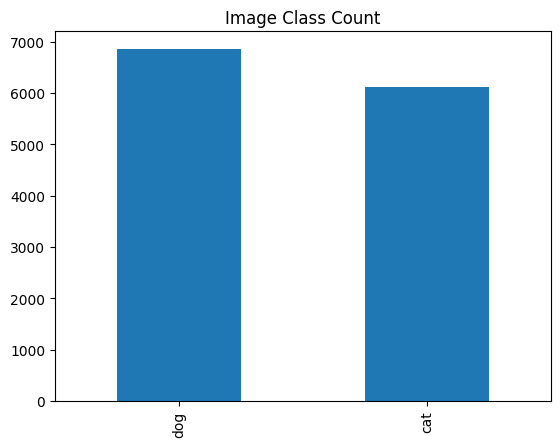

In [ ]:
# Plot the image count of dogs vs cats.  
df.LabelName.value_counts().plot(kind='bar')
plt.title('Image Class Count')
plt.show()

## 1.4.2 Correlation Matrix for the bounding box data
This is the correlation matrix with the range from +1 to -1 where +1 is highly and positively correlated and -1 will be highly negatively correlated.
XClick1X, XClick2X, XClick3X, XClick4X, XClick1Y, XClick2Y, XClick3Y, and XClick4Y columns are correlated. 


<Axes: >

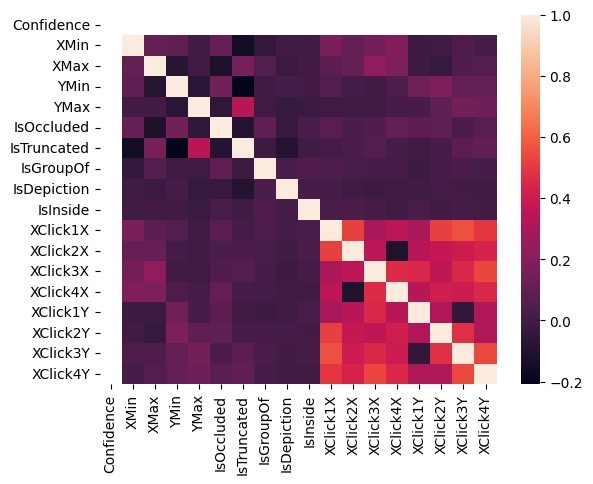

In [ ]:
# Create correlation matrix of the bounding box image data.
df.corr()
sns.heatmap(df.corr())

In [ ]:
# Installing ydata_profiling library since Colab does not have it by default
!pip install ydata_profiling

from ydata_profiling import ProfileReport

## 1.4.3 Profile report of the bounding box data.
The profile report consist of the following:

1) **Overview:** provides statistical information about the dataset.

2) **Variables:** detailed statistics of each of the columns and a histogram of the data distribution.

3) **Interactions:** interactive plot to compare interactions between two varaibles.

4) **Correlations:** heat map of correlation between variables.

5) **Missing values:** bar graph of the count of missing values for each variable. 

6) **Sample:** displays for 10 rows and last 10 rows of data set. 


In [ ]:
#Create Profile Report

profile = ProfileReport(df, title="Cat and Dogs Dataset", explorative=True)
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
# Image Files

In [ ]:
# Get image counts for cats and dogs
print(f"There are a total of {len(glob.glob1(images_path, '*.jpg'))} cat and dog images")

There are a total of 12966 cat and dog images


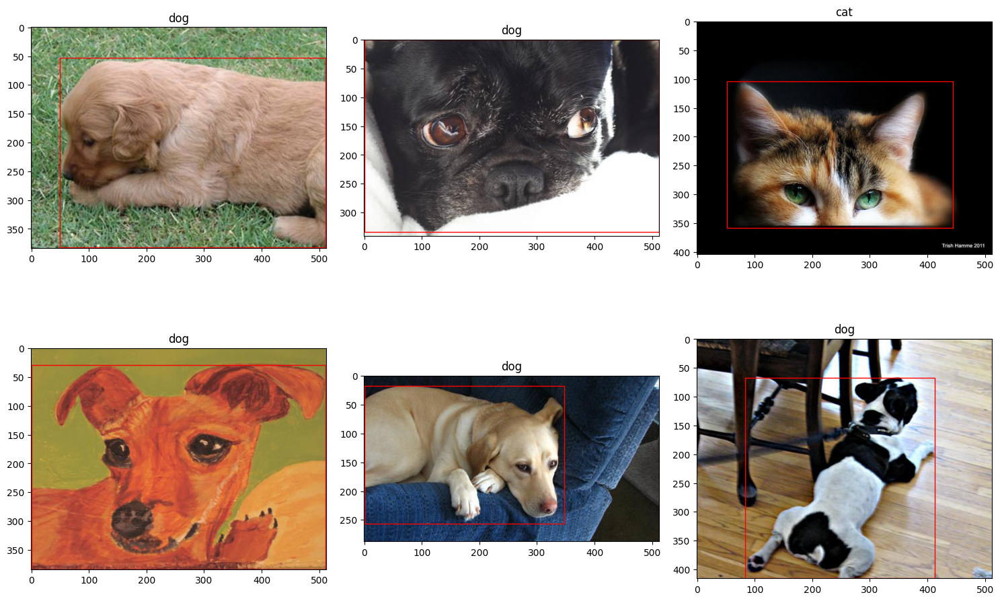

In [ ]:
# plot random 6 images
fig, ax = plt.subplots(nrows=2, ncols=3, sharex=False, sharey=False,figsize=(15,10))
ax = ax.flatten()

for i,j in enumerate(np.random.choice(df.shape[0], size=6, replace=False)):
    img = mpimg.imread(images_path + "/" + df.ImageID.values[j] + '.jpg')
    h, w = img.shape[:2]
    coords = df.iloc[j,4:8]
    ax[i].imshow(img)
    ax[i].set_title(df.LabelName[j])
    ax[i].add_patch(plt.Rectangle((coords[0]*w, coords[2]*h), 
                                  coords[1]*w-coords[0]*w, coords[3]*h-coords[2]*h, 
                                  edgecolor='red', facecolor='none'))

plt.tight_layout()
plt.show()

In [ ]:
# Go through all images and record the shape of the image in pixels and the memory size
img_shape = []
img_size = np.zeros((df.shape[0], 1))

for i,f in enumerate(tqdm(df['ImageID'])):
    file = images_path + '/' + f + '.jpg'
    img = Image.open(file)
    img_shape.append(f"{img.size[0]}x{img.size[1]}")
    img_size[i] += os.path.getsize(file)

  0%|          | 0/12966 [00:00<?, ?it/s]

In [ ]:
#Count all the different image shapes
img_shape_count = Counter(img_shape)
# create a dataframe for image shapes
img_df = pd.DataFrame(set(img_shape_count.items()), columns=['img_shape','img_count'])

In [ ]:
#There are a ton of different image shapes. Let's narrow this down by getting a 
#sum of any image shape that has a cout less than 100 and put that in a category called other
img_df = img_df.append({'img_shape': 'other','img_count': img_df[img_df.img_count < 100].img_count.sum()}, 
                       ignore_index=True)
#Drop all image shapes
img_df = img_df[img_df.img_count >= 100]
#Check if the count sum matches the number of images
img_df.img_count.sum() == df.shape[0]

<ipython-input-32-cad1beb13529>:3: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  img_df = img_df.append({'img_shape': 'other','img_count': img_df[img_df.img_count < 100].img_count.sum()},


True

##  1.4.4 Bar Graph of Image Shape Counts

This is a bar plot of the all the image shape counts. The "other" category includes all of the image shapes that have a count of less than 100. 512x384 is the image size that occurs the most.  

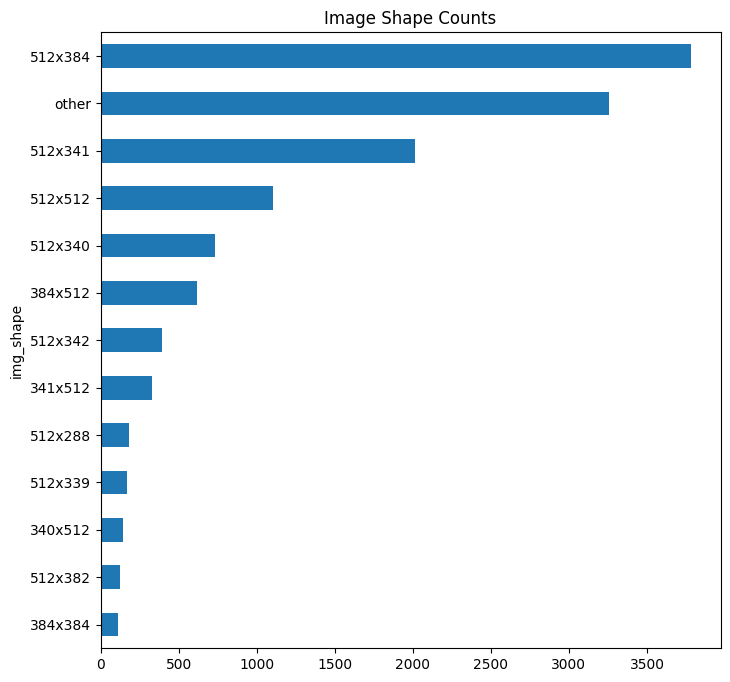

In [ ]:
#Plot image shape counts
img_df.sort_values('img_count', inplace=True)
img_df.plot(x='img_shape', y='img_count', kind='barh', figsize=(8,8), legend=False)
plt.title('Image Shape Counts')
plt.show()

In [ ]:
# convert to megabytes
img_size = img_size / 1000

##  1.4.5 Plots of Image Size Distribution

This is a histogram and box plot of image size (MB).  

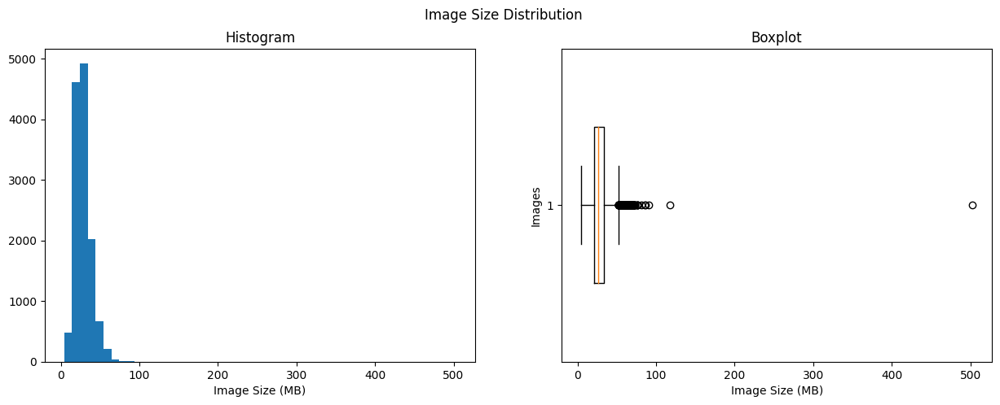

In [ ]:
# Plot image size distribution
fig, ax = plt.subplots(1, 2, figsize=(15,5))
fig.suptitle('Image Size Distribution')
ax[0].hist(img_size, bins=50)
ax[0].set_title('Histogram')
ax[0].set_xlabel('Image Size (MB)')
ax[1].boxplot(img_size, vert=False, widths=0.5)
ax[1].set_title('Boxplot')
ax[1].set_xlabel('Image Size (MB)')
ax[1].set_ylabel('Images')
plt.show()

#1.5 Machine Algorithms and Metrics


For this project, we will use many different algorithms and metrics to classify images of cats or dogs. The ones we plan to apply throughout this project are scikit-learn cat/dog detector pipeline which will include classifier, linear regression, homegrown linear regression, homegrown logistic regression, PyTorch digit detector pipeline, and CNN. We will first apply grayscale as a pre-processing step to simplify our custom histogram of oriented gradients (HOG) transformer.


Scikit-learn cat/dog detector pipeline will be a simple classification model that utilizes our custom hog_transformer for feature extraction, standardscaler to standardize, and test different classifiers. Next, we will begin a linear regression model. 


Linear regression will be utilized by extracting features and then standardizing through hog_transformer and standard scaler. We will utilize mean squared error as the loss function and also the evaluation metric.


Homegrown linear regression will be a custom built model of linear regression that extends the MSE loss function to four variables. Our implementation will be via PyTorch.


Homegrown logistic regression will be our custom built model of logistic regression that extends the cross-entropy loss function to include mean squared error as well. 


PyTorch digit detector model will be used with a multilayer perceptron (MLP). The algorithm will utilize combined loss functions of CXE and MSE and then we will test different optimizers (SGD and adam) for better evaluation metrics. 


We may implement a Convolutional neural network (CNN) with multi-heads to do cat-dog detection in hopes to receive the best overall evaluation metrics in comparison to our previous models. Since this is a new model, we will begin building our understanding of its implementations and evaluation metrics within the coming weeks. 


Overall, with these algorithms we will be looking for lower MSE values and higher accuracy scores to determine the best model for the classification task.


**Accuracy Equation:**
$${Accuracy} = \dfrac {c}{n} $$

Notation:
\begin{align}
c &\quad \text{Number  of  correct  predictions}\\
n &\quad \text{Total number of predictions}\\
\end{align}


**MSE Equation:**
Loss function that works for multiple alogorithms including logistic regression

\begin{equation}\tag{Reference: Lab 4 Linear Regression}
MSE(\boldsymbol{\theta}) = f(\boldsymbol{\theta}) = \frac{1}{m}\sum_{i=1}^{m}\left[ \mathbf{x}_i\cdot\boldsymbol{\theta} - y_i\right]^2
\end{equation}

Notation:
\begin{align}
m &\quad \text{Number  of  examples in data set}\\
\mathbf{x}_i &\quad \text{input variable}\\
(\boldsymbol{\theta}) &\quad \text{model's parameter vector}\\
y &\quad \text{target class}\\
\end{align}


**CXE Equation:**
Cross entropy loss function
\begin{align}\tag{Reference: Lab 7 Logistic Regression}
J(\boldsymbol{\Theta}) = - \dfrac{1}{m}\sum\limits_{i=1}^{m}\sum\limits_{k=1}^{K}{y_k^{(i)}\log\left(\hat{p}_k^{(i)}\right)}
\end{align}

Notation:
\begin{align}
m &\quad \text{Number  of  examples in data set}\\
K &\quad \text{number of classes}\\
y &\quad \text{target class}\\
\hat{p} &\quad \text{probability for classes}\\
\end{align}

##1.5.1 Machine Learning Baseline Pipelines

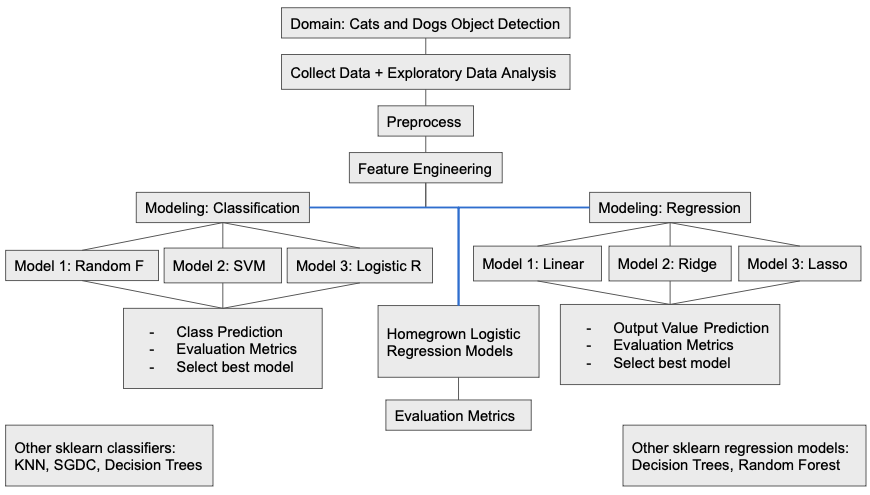



###1.5.1.1 SKLearn cat/dog detector
The classifier pipeline shown below will be created using SKlearn. We plan to create different steps, including basic preprocessing,  that will link our data together in order to produce results for Grid Search (Hyper-parameter tuning) for classification tasks. We will evaluate performance based on metrics like accuracy and confusion matrix etc. Also, we will experiment with several classifiers to compare performance. Based on this, we will choose the best classifier.

In [ ]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.linear_model import SGDClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LinearRegression

'''
Run this code block to generate interactive graphs.
'''

#https://scikit-learn.org/stable/modules/generated/sklearn.svm.SVC.html
pipe1_class = Pipeline([
        ('scaler', StandardScaler()),
        ('SVM', SVC(kernel='rbf')) #for complex data. RBF is deafult
    ])

display(pipe1_class)

#https://scikit-learn.org/stable/modules/generated/sklearn.svm.SVC.html
pipe2_class = Pipeline([
        ('scaler', StandardScaler()),
        ('SVM', SVC(kernel='linear')) #for simpler data
    ])

display(pipe2_class)

#https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.LogisticRegression.html
pipe3_class = Pipeline([
        ('scaler', StandardScaler()),
        ('LogistcRigression', LogisticRegression(random_state=0)) #for simpler data
    ])

display(pipe3_class)

#https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.SGDClassifier.html#sklearn.linear_model.SGDClassifier
pipe4_class = Pipeline([
        ('scaler', StandardScaler()),
        ('SGDC', SGDClassifier(loss = 'log', max_iter=1000, tol=1e-3)) #for simpler data
    ])

display(pipe4_class)

#https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.RandomForestClassifier.html
pipe5_class = Pipeline([
        ('scaler', StandardScaler()),
        ('randomforest', RandomForestClassifier(max_depth=2, random_state=0)) #for simpler data
    ])

display(pipe5_class)

Pipeline(steps=[('scaler', StandardScaler()), ('SVM', SVC())])

Pipeline(steps=[('scaler', StandardScaler()), ('SVM', SVC(kernel='linear'))])

Pipeline(steps=[('scaler', StandardScaler()),
                ('LogistcRigression', LogisticRegression(random_state=0))])

Pipeline(steps=[('scaler', StandardScaler()),
                ('SGDC', SGDClassifier(loss='log'))])

Pipeline(steps=[('scaler', StandardScaler()),
                ('randomforest',
                 RandomForestClassifier(max_depth=2, random_state=0))])

### 1.5.1.2 Linear Regression

Our regression model will have steps that will contribute  to producing results for Hyper-parameter tuning Grid Search. This will allow us to compute predictions and evaluate models performance with sklearn metrics like MSE. Other regression models will be implemented to compare performance between them.

In [ ]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso

'''
Run this code block to generate interactive graphs.
'''

#https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.LinearRegression.html
pipe1_reg = Pipeline([
        ('scaler', StandardScaler()),
        ('linearRegression', LinearRegression(n_jobs = -1))
    ])

display(pipe1_reg)


#https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.Ridge.html
pipe2_reg = Pipeline([
        ('scaler', StandardScaler()),
        ('ridge', Ridge(alpha=1.0))
    ])

display(pipe2_reg)


#https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.Lasso.html
pipe3_reg = Pipeline([
        ('scaler', StandardScaler()),
        ('lasso', Lasso(alpha=0.1))
    ])

display(pipe3_reg)

Pipeline(steps=[('scaler', StandardScaler()),
                ('linearRegression', LinearRegression(n_jobs=-1))])

Pipeline(steps=[('scaler', StandardScaler()), ('ridge', Ridge())])

Pipeline(steps=[('scaler', StandardScaler()), ('lasso', Lasso(alpha=0.1))])

#1.6 References

* Google Sheets authentication and data loading: https://colab.research.google.com/notebooks/snippets/sheets.ipynb

* Mounting data to a Colab session: https://www.marktechpost.com/2019/06/07/how-to-connect-google-colab-with-google-drive/

* Generating Gantt plots using matplotlib:
https://www.tutorialspoint.com/how-to-get-a-gantt-plot-using-matplotlib

* How to Make a Gantt Chart in Python with Matplotlib: https://www.datacamp.com/tutorial/how-to-make-gantt-chart-in-python-matplotlib

* Some sections in the Data Description are based on the sample code for the Phase 2 of this course: https://github.iu.edu/jshanah/I526_AML_Student/tree/master/Assignments/Unit_Project-Cats-vs_Dog_Detection/CaDoD_submissions

* Pandas Profiling - Easy Exploratory Data Analysis in Python: https://towardsdatascience.com/pandas-profiling-easy-exploratory-data-analysis-in-python-65d6d0e23650

* EDA - Exploratory Data Analysis: Using Python Functions: https://www.digitalocean.com/community/tutorials/exploratory-data-analysis-python

* CaDoD_Phase_2_baseline_SKLearn_homegrown.ipynb Jupyter Notebook

* Pipeline, Standard Scaler, classification and regression models: https://scikit-learn.org/stable/index.html